## Traffic Flow Simulation using the Nagel-Schreckenberg Model

Explanation: We create a 2D array where rows represent time steps and columns represent positions on the road. 
         A value of 1 indicates a car, and 0 indicates an empty cell. 
         We then use imshow to display this array as an image.


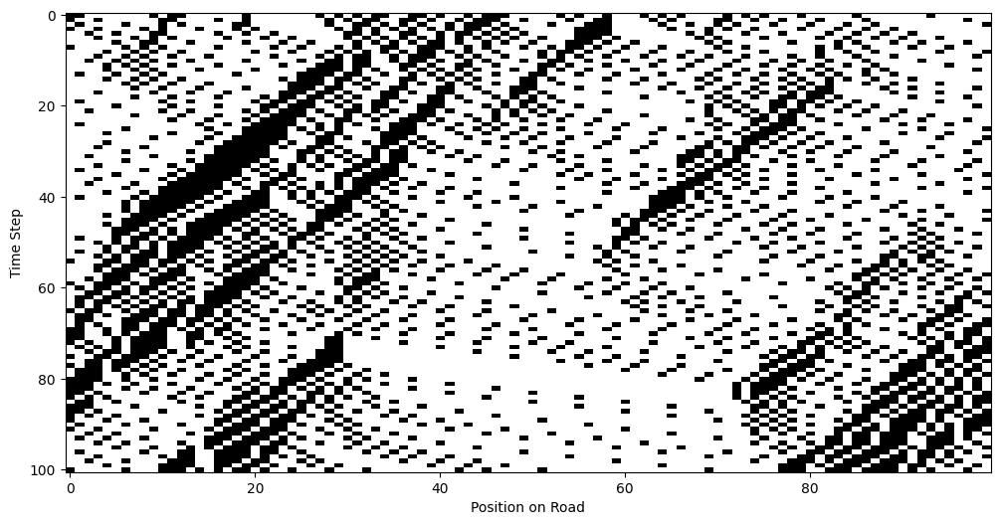

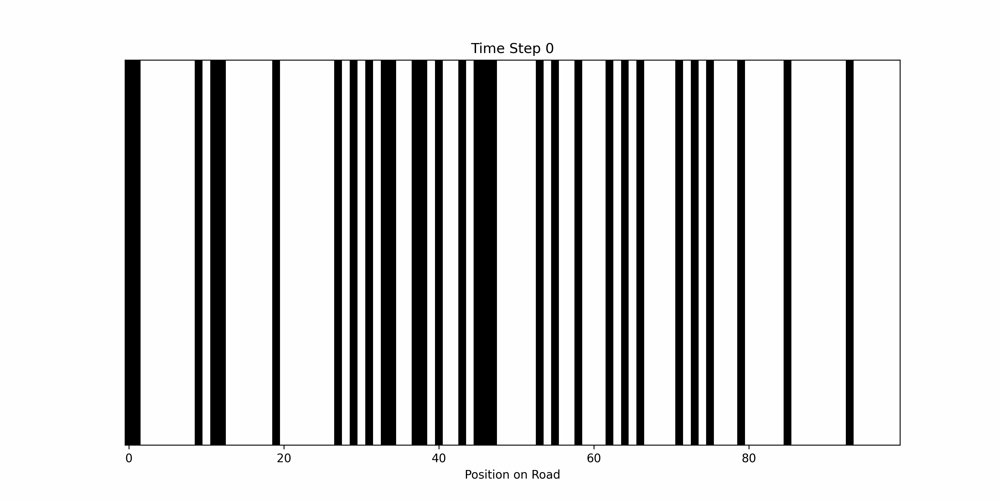

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML

# Simulation parameters
road_length = 100  # Length of the road (number of cells)
num_cars = 30  # Number of cars on the road
max_speed = 5  # Maximum speed of cars (cells per time step)
p_slow = 0.3  # Probability of random slowing down
num_steps = 100  # Number of time steps to simulate

# road: An array representing the road where -1 indicates an empty cell.
# Initialize the road with empty cells (-1)
road = np.full(road_length, -1)

# Randomly place cars on the road with random initial speeds
car_positions = np.random.choice(road_length, num_cars, replace=False)
# Random initial speeds assigned to each car.
initial_speeds = np.random.randint(0, max_speed + 1, num_cars)
road[car_positions] = initial_speeds


def update_road(road):
    new_road = np.full_like(road, -1)
    road_length = len(road)
    for i in range(road_length):
        if road[i] != -1:
            speed = road[i]
            # Step 1: Acceleration
            if speed < max_speed:
                speed += 1
            # Step 2: Slowing down due to other cars
            distance = 1
            while distance <= speed and road[(i + distance) % road_length] == -1:
                distance += 1
            distance -= 1
            speed = min(speed, distance)
            # Step 3: Randomization
            if speed > 0 and np.random.rand() < p_slow:
                speed -= 1
            # Step 4: Move the car
            new_position = (i + speed) % road_length
            new_road[new_position] = speed
    return new_road


# Store the history of the road for visualization
road_history = [road.copy()]
for step in range(num_steps):
    road = update_road(road)
    road_history.append(road.copy())


# Prepare the figure
fig, ax = plt.subplots(figsize=(12, 6))
ax.set_xlabel("Position on Road")
ax.set_ylabel("Time Step")

# Convert road history to a 2D array for visualization
road_display = []
for state in road_history:
    display_state = np.where(state >= 0, 1, 0)  # 1 for car, 0 for empty
    road_display.append(display_state)
road_display = np.array(road_display)

# Display the simulation as an image
im = ax.imshow(road_display, cmap="Greys", interpolation="none", aspect="auto")

print(
    """Explanation: We create a 2D array where rows represent time steps and columns represent positions on the road. 
         A value of 1 indicates a car, and 0 indicates an empty cell. 
         We then use imshow to display this array as an image.
         WE then save the traverse of the road as an animated gif and show that."""
)

# Show the generated road plot
plt.show()

image_filenames = []
for i, r in enumerate(road_display):
    ax.clear()
    ax.imshow([r], cmap="Greys", aspect="auto")
    ax.set_title(f"Time Step {i}")
    ax.set_xlabel("Position on Road")
    ax.set_yticks([])
    save_path = f"traffic_{i}.png"
    fig.savefig(save_path, dpi=300)
    image_filenames.append(save_path)


def create_gif(image_filenames, output_filename="traffic.gif", fps=2):
    """
    Creates an animated GIF from a list of image filenames.
    """
    from PIL import Image

    images = [Image.open(filename) for filename in image_filenames]
    images[0].save(
        output_filename,
        save_all=True,
        append_images=images[1:],
        duration=1000 // fps,
        loop=0,
    )


create_gif(image_filenames, output_filename="traffic.gif", fps=2)

from IPython.display import Image

Image(filename="traffic.gif")